In [1]:
import numpy as np
import matplotlib.pyplot as plt

from scipy.special import j0

from scipy.integrate import quad
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

from matplotlib import animation
from IPython.display import HTML

from joblib import Parallel, delayed

In [2]:
def E_pulse(t, E0, Omega, sigma, t0):
    # Electric field of the pulse
    return E0 * np.exp(-((t - t0)**2) / (2 * sigma**2)) * np.sin(Omega * t)

def A_pulse(E0, Omega, sigma, t0, t):
    # Vector potential from the electric field pulse
    A = np.zeros_like(t)
    for i, ti in enumerate(t):
        A[i], A_error = quad(E_pulse, -np.inf, ti, args=(E0, Omega, sigma, t0))
    return -A, A_error

def Hamiltonian(L, J0, Delta, A, V, g):

    H = np.zeros((2 * L, 2 * L), dtype=complex)
    
    # --- Sample --- #

    for i in range(L):
        H[i, (i + 1) % L] = -J0 * np.exp(1j * A)
        H[(i + 1) % L, i] = -J0 * np.exp(-1j * A)
        
        if i % 2 == 0:
            H[i, i] = Delta
        else:
            H[i, i] = -Delta

    # --- Probe --- #

    for i in range(L):
        
        H[i + L, i + L] = V

    # --- Coupling --- #
    
    for i in range(L):
        H[i, i + L] = g
        H[i + L, i] = g

    return H

def H0(L, J0, Delta):

    H = np.zeros((L, L), dtype=complex)
    
    # --- Sample --- #

    for i in range(L):
        H[i, (i + 1) % L] = -J0 
        H[(i + 1) % L, i] = -J0
        
        if i % 2 == 0:
            H[i, i] = Delta
        else:
            H[i, i] = -Delta
            
    return H

def C0(L, J0, Delta, N_occ):

    H = H0(L, J0, Delta)
    eigvals, eigvecs = np.linalg.eigh(H)

    # Occupy the lowest N_occ states
    occupied_states = eigvecs[:, :N_occ]

    # Construct the correlation matrix
    C_0 = occupied_states @ occupied_states.conj().T
    
    return C_0

def simulation(C0, A, Probe, J0, Delta, V, times):

    L = C0.shape[0]

    C_ij = np.zeros((2*L, 2*L, len(times)), dtype=complex) 

    C_ij[:, :, 0] = np.block([[C0, np.zeros((L, L))], [np.zeros((L, L)), np.zeros((L, L))]])
        
    for t in range(1, len(times)):
            
        dt = times[t] - times[t-1]
            
        H = Hamiltonian(L, J0, Delta, A[t], V, g=Probe[t])

        eigvals, eigvecs = np.linalg.eigh(H)
        U = eigvecs @ np.diag(np.exp(-1j * eigvals * dt)) @ np.linalg.inv(eigvecs)

        C_ij[:, :, t] = U @ C_ij[:, :, t-1] @ U.conj().T

    return C_ij

def entropy(rho, cut, tol=1e-6):

    rho_cut = rho[:cut, :cut]
    
    eigvals = np.linalg.eigvals(rho_cut)
    eigvals = np.real(eigvals)  # Ensure eigenvalues are real
    
    eigvals = np.clip(eigvals, tol, 1.0)  # Clip eigenvalues to avoid log(0) issues

    S = -np.sum(eigvals * np.log(eigvals))
    return S

def Green_function(psi_occ, J0, Delta, A, Probe, w, times):

    L = psi_occ.shape[0]
    N_occ = psi_occ.shape[1]
    N_t = times.shape[0]

    psi_t = np.zeros((2*L, N_occ, N_t), dtype=complex)

    psi_t[:L, :, 0] = psi_occ

    G_ij = np.zeros((2*L, 2*L, N_t), dtype=complex)

    G_ij[:, :, 0] = psi_t[:, :, 0] @ psi_t[:, :, 0].conj().T

    for t in range(1, N_t):

        dt = times[t] - times[t-1]

        H_t = Hamiltonian(L, J0, Delta, A[t], V=w, g=Probe[t])

        eigvals_t, eigvecs_t = np.linalg.eigh(H_t)

        U = eigvecs_t @ np.diag(np.exp(-1j * eigvals_t * dt)) @ eigvecs_t.conj().T

        psi_t[:, :, t] = U @ psi_t[:, :, t-1]

        G_ij[:, :, t] = psi_t[:, :, t] @ psi_t[:, :, 1].conj().T

    return G_ij

def folding(n_w_t_k, k, a):
    
    N_omega, N_t, N_k = n_w_t_k.shape

    fold_param = np.pi / a
    n_w_t_k_folded = np.zeros((N_omega, N_t, N_k), dtype=float)

    # Fold k values into the first Brillouin zone #
    
    k_folded = (k + fold_param) % (2 * fold_param) - fold_param 

    # Find index of folded k matching original k and populates n_w_t_k_folded #

    for i in range(len(k)):
        target = np.argmin(np.abs(k - k_folded[i]))
        n_w_t_k_folded[:, :, target] += n_w_t_k[:, :, i] 

    # Crop k axis (remove indeces outside 1st Brillouin zone) #

    k_idx = np.where(np.max(n_w_t_k_folded[:, -1, :], axis=0) > 1e-6)[0] # Check which k values have non-zero spectral weight
    kmin = k_idx[0] # Define min cutoff
    kmax = k_idx[-1] # Define max cutoff

    k_folded = k_folded[kmin:kmax+1] # Crop k axis 

    n_w_t_k_folded = n_w_t_k_folded[:, :, kmin:kmax+1] # Crop n_w_t_k_folded

    return k_folded, n_w_t_k_folded

def visualise_matrix(H, cmap='Greys', figsize=(12,5)):
    # Construct subplots for real and imaginary parts of Hamiltonian matrix
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # Real part
    im_real = axes[0].imshow(H.real, cmap=cmap)
    axes[0].set_title('Real Part')
    axes[0].set_xlabel('Column')
    axes[0].set_ylabel('Row')
    plt.colorbar(im_real, ax=axes[0])
    
    # Imaginary part
    im_imag = axes[1].imshow(H.imag, cmap=cmap)
    axes[1].set_title('Imaginary Part')
    axes[1].set_xlabel('Column')
    axes[1].set_ylabel('Row')
    plt.colorbar(im_imag, ax=axes[1])
    
    fig.suptitle('Matrix visualization for (16x16) Hamiltonian')
    plt.show()

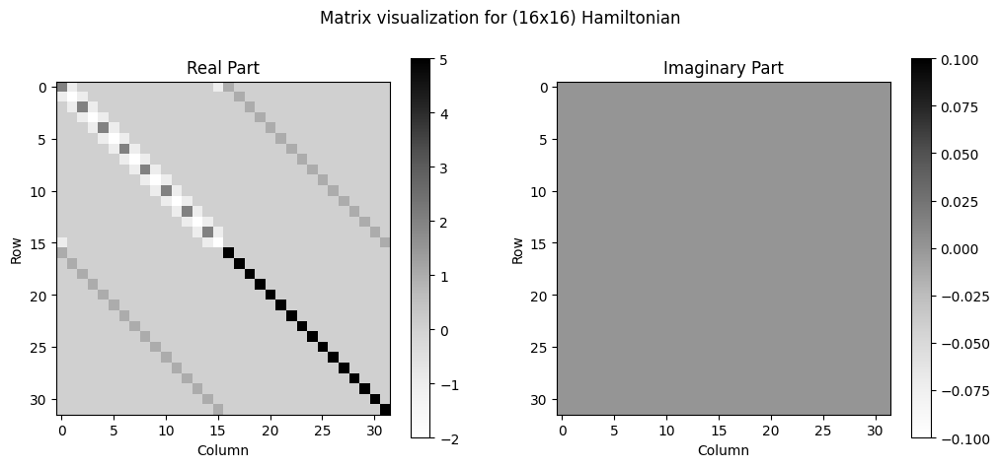

In [3]:
################
# --- test --- #
################

L = 16
t = 0

J0 = 1.0
Delta = 2.0
A0 = 0.0

V = 5.0
g = 1.0

H = Hamiltonian(L, J0, Delta, A0, V, g)
visualise_matrix(H)


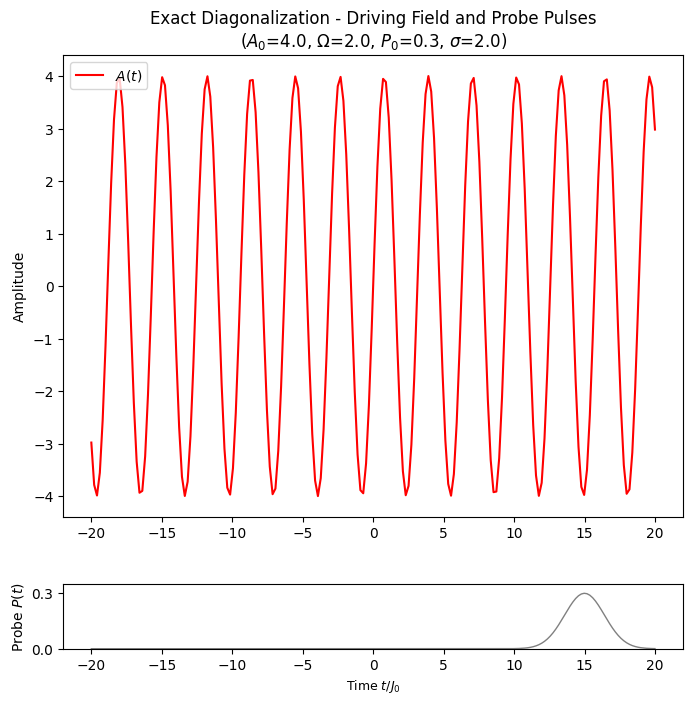

In [4]:
L = 64

N_t = 200
times = np.linspace(-20.0, 20.0, N_t)

N_omega = 100
omega_scan = np.linspace(-6.0, 6.0, N_omega)

J0 = 1.0
Delta = 2.0

A0 = 4.0
omega = 2.0

P0 = 0.3
t_probe = 15.0
sigma = 2.0

A = A0 * np.sin(omega * times)
Probe = P0 * np.exp(-(times - t_probe)**2 / (sigma**2))

plt.figure(figsize=(8, 6))
ax_main = plt.gca()
plt.plot(times, A, color='red', label=r'$A(t)$')
plt.legend(loc='upper left')
plt.ylabel(r'Amplitude')
plt.title(r'Exact Diagonalization - Driving Field and Probe Pulses' + '\n' + r'($A_0$={:.5}, $\Omega$={:.1f}, $P_0$={:.1f}, $\sigma$={:.3})'.format(A0, omega, P0, sigma))

# Add inset axes at the bottom showing only the probe pulse
ax_inset = inset_axes(ax_main, width="100%", height="40%", loc='lower center',
                       bbox_to_anchor=(0.0, -0.3, 1.0, 0.35), 
                       bbox_transform=ax_main.transAxes)

ax_inset.plot(times, Probe, color='gray', linewidth=1)
ax_inset.set_xlabel(r'Time $t/J_0$', fontsize=9)
ax_inset.set_ylabel(r'Probe $P(t)$')
ax_inset.set_ylim(0.0, 0.35)
ax_inset.set_yticks([0.0, 0.3])


plt.show()

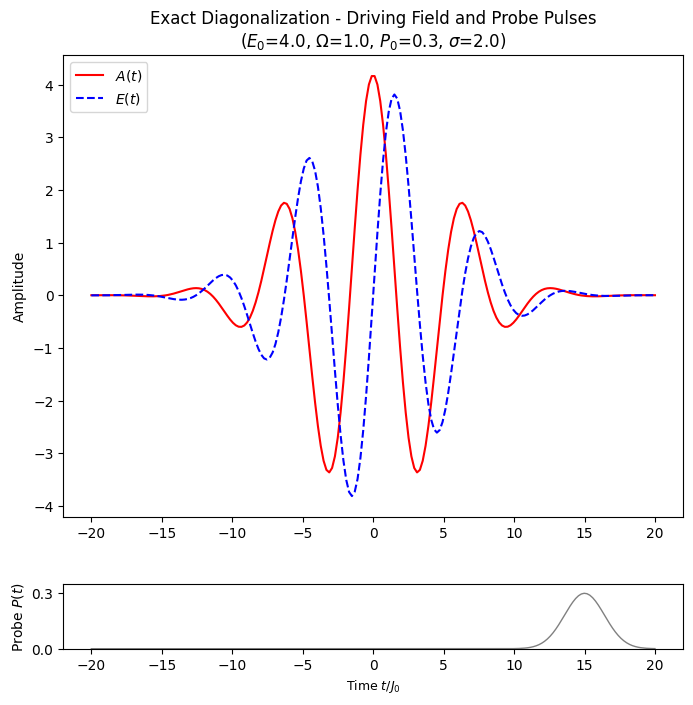

In [ ]:
L = 64

N_t = 200
times = np.linspace(-20.0, 20.0, N_t)

N_omega = 100
omega_scan = np.linspace(-6.0, 6.0, N_omega)

J0 = 1.0
Delta = 2.0

E0 = 4.0
T = 2 * np.pi / 1.0
omega = 2 * np.pi / T

t0 = 0.0
delta = 5.0

P0 = 0.3
t_probe = 15.0
sigma = 2.0

E = E_pulse(times, E0, omega, delta, t0)   
A, A_error = A_pulse(E0, omega, delta, t0, times)

Probe = P0 * np.exp(-(times - t_probe)**2 / (sigma**2))

plt.figure(figsize=(8, 6))
ax_main = plt.gca()
plt.plot(times, A, color='red', label=r'$A(t)$')
plt.plot(times, E, color='blue', linestyle='--', label=r'$E(t)$')
plt.legend(loc='upper left')
plt.ylabel(r'Amplitude')
plt.title(r'Exact Diagonalization - Driving Field and Probe Pulses' + '\n' + r'($E_0$={:.5}, $\Omega$={:.1f}, $P_0$={:.1f}, $\sigma$={:.3})'.format(E0, omega, P0, sigma))

# Add inset axes at the bottom showing only the probe pulse
ax_inset = inset_axes(ax_main, width="100%", height="40%", loc='lower center',
                       bbox_to_anchor=(0.0, -0.3, 1.0, 0.35), 
                       bbox_transform=ax_main.transAxes)

ax_inset.plot(times, Probe, color='gray', linewidth=1)
ax_inset.set_xlabel(r'Time $t/J_0$', fontsize=9)
ax_inset.set_ylabel(r'Probe $P(t)$')
ax_inset.set_ylim(0.0, 0.35)
ax_inset.set_yticks([0.0, 0.3])


plt.show()

In [4]:
H_0 = H0(L, J0, Delta)

filling = L // 2

C_0 = C0(L, J0, Delta, N_occ=filling)

C_ij = Parallel(n_jobs=-1, verbose=10)(delayed(simulation)(C_0, A, Probe, J0, Delta, w, times) for w in omega_scan)

print("Converting to array...")

C_ij = np.array(C_ij)  # Shape: (N_omega, 2L, 2L, N_t)

print("Simulation complete!")
print("C_ij.shape:", C_ij.shape)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   22.2s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:   26.5s
[Parallel(n_jobs=-1)]: Done  61 tasks      | elapsed:   33.9s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:   41.7s
[Parallel(n_jobs=-1)]: Done  88 out of 100 | elapsed:   49.4s remaining:    6.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   53.4s finished


Converting to array...
Simulation complete!
C_ij.shape: (100, 128, 128, 200)


Imaginary parts due to numerical errors: 3.5531891025248427e-16 3.126365990211606e-16


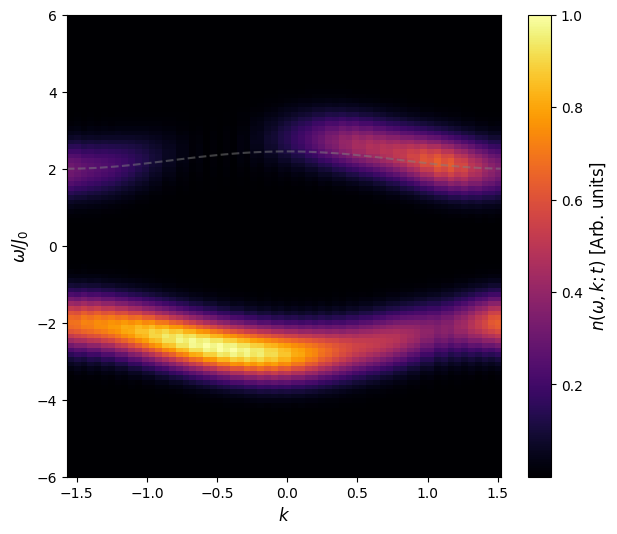

In [10]:
C_probe = C_ij[:, L:, L:, :]

N_unit = L
dx = 2

k = np.linspace(-np.pi/2, np.pi/2, N_unit, endpoint=False)
i_A = np.arange(0, L, dx)
i_B = np.arange(1, L, dx)

phase_A = np.exp(-1j * np.outer(k, i_A)) / np.sqrt(N_unit)
phase_B = np.exp(-1j * np.outer(k, i_B)) / np.sqrt(N_unit)

n_A = np.zeros((N_omega, N_t, N_unit), dtype=complex)
n_B = np.zeros((N_omega, N_t, N_unit), dtype=complex)

for w in range(N_omega):
    for t in range(N_t):
        n_A[w, t, :] = np.diag(phase_A @ C_probe[w, :, :, t][np.ix_(i_A, i_A)] @ phase_A.conj().T)
        n_B[w, t, :] = np.diag(phase_B @ C_probe[w, :, :, t][np.ix_(i_B, i_B)] @ phase_B.conj().T)

print("Imaginary parts due to numerical errors:", np.max(np.imag(n_A)), np.max(np.imag(n_B)))

n_k = np.real(n_A + n_B) 

# Plots the exact solution of the energy spectrum

J_eff = J0 * j0(E0/omega)


e_k = np.sqrt(2 * J0 * np.cos(k)**2 + (Delta)**2)



plt.figure(figsize=(7, 6))


plt.plot(k, e_k, color='gray', linestyle='--', alpha=0.5)


plt.imshow(
    n_k[:, -1, :] / np.max(n_k[:, -1, :]),  # Normalize to max value for better visualization
    extent=[k[0], k[-1], omega_scan[0], omega_scan[-1]],
    aspect='auto',
    cmap='inferno',
    origin='lower'
)

cbar = plt.colorbar(label=r'$n(\omega, k; t)$ [Arb. units]')
cbar.set_label(r'$n(\omega, k; t)$ [Arb. units]', fontsize=12)

plt.xlabel(r'$k$', fontsize=12)
plt.ylabel(r'$\omega / J_0$', fontsize=12)
#plt.title('ED PBC - Extended Zone Energy Spectrum at Final Time (2-Site Basis)' + '\n' + r'($J_0$={}, $\Delta$={}, $E_0$={:.2}, $\Omega$={:.1f}, $P_0$={}, $t_{{probe}}$={:.3}, $\sigma$={:.3})'.format(J0, Delta, E0, omega, P0, t_probe, sigma))
plt.show()


In [86]:
max = np.max(n_k)
min = np.min(n_k)

# Set up the figure and axis for animation 
fig, ax = plt.subplots(figsize=(8, 6)) 
im = ax.imshow(n_k[:, 0, :], extent=[np.min(k)/np.pi, np.max(k)/np.pi, omega_scan[0], omega_scan[-1]], aspect='auto', origin='lower', cmap='inferno', vmin=min, vmax=max) 
plt.colorbar(im, ax=ax, label=r'$n(k, \omega, t)$')
plt.title(
    'ED PBC - 1st Brillouin Zone Energy Spectrum at Final Time' 
    + '\n' + 
    r'($J_0$={}, $\Delta$={}, $A_0$={:.5}, $\Omega$={:.1f}, $P_0$={}, $t_{{probe}}$={:.3}, $\sigma$={:.3})'.format(J0, Delta, A0, omega, P0, t_probe, sigma)) 
ax.set_xlabel('k / π') 
ax.set_ylabel('ω / J') 

# Animation update function 
def update(frame): 
    im.set_data(n_k[:, frame, :]) 
    ax.set_title(
        f'ED PBC - 1st Brillouin Zone Energy Spectrum at t= {np.round(times[frame], 2)}' 
        + '\n' + 
        r'($J_0$={}, $\Delta$={}, $E_0$={:.5}, $\Omega$={:.1f}, $P_0$={}, $t_{{probe}}$={:.3}, $\sigma$={:.3})'.format(J0, Delta, E0, omega, P0, t_probe, sigma))
    return [im] 

ani = animation.FuncAnimation(fig, update, frames=N_t, blit=True) 
plt.rcParams['animation.embed_limit'] = 800 # in MB, so 800 MB limit 
plt.close(fig) 
HTML(ani.to_jshtml())